# Which Samples do we have and is it worth loking into them?

I'll try to give a conclusive summary of the analysis we have run so far and and what is going on.

## 1. The Bird

The Bird is an experiment with three samples:

1. PBS_BM
2. PBS_Spl
3. TM_Spl

Where the sort has tecnically worked, but the sorted cells are Red Blood porogenitors instead of the expected cell.

In a way this might be usable to compare PBS_Spl -> PBS_Spl (normal setting) and then PBS_Spl <-> TM_Spl to see what does change in the cancer setting. But the TM_Pbs control is missing.

## 2. BM and Spleen 2023

I do not have the original times for when I got the data or when I analyzed it last as all time staps have been reset while moving to the new analysis system.
I have around 10 different versions of this data and it is kind of hard to decode what I have.

I have these samples:

BM_PBS, BM_TM and Spleen_TM.

The data itself seams to be usable, but the Spleen cells are very view. But there is a decent number of Cxcl12 positive cells in this data.

## 3. December 2023

I think these cells are from spleen.

PBS_CD45_Neg_gex, TM_CD45_Neg_gex, PBS_CD45_Pos_gex and TM_CD45_Pos_gex

In this experiment something has not worked in the CD45_Pos sort. Both samples are a mess with too many cells and also a ton of different "cell types". Tina thinks this sort can just not be used. And I agree.
The CD45 negaitve cells should be similar to the cells we got in 2.


# What to do with that?

With all of these cells we might be able to tell some story, but for that to be possible we need to merge them all together.

I'll du just this in the following:

In [1]:
%load_ext autotime

import scvelo as scv
import loompy
import scanpy
import igraph
import glob, os
import pandas as pd
import os
import re
import subprocess
from collections import Counter
import numpy as np
from shutil import rmtree
import os
import anndata

import h5py
from shutil import copyfile


def copyFiles(files, to):
    for f in files:
        name = os.path.basename( f )
        print( f"copy {f} to {to}" )
        copyfile( f, os.path.join(to, name ) )
    print( "all copied" )

time: 5.16 s (started: 2025-08-27 09:12:50 +02:00)


In [2]:
ofile="2025_merged_Stroma_samples.h5ad"
raw = "WhatCaWeDoFromHere_raw.h5ad"
saved="Chatties_CellTypes_added.h5ad"

time: 273 µs (started: 2025-08-27 09:12:55 +02:00)


In [3]:
adata=anndata.read( raw )
adata

AnnData object with n_obs × n_vars = 27864 × 20540
    obs: 'sname', 'fname', 'n_counts', 'n_genes', 'label', 'cell', 'predicted.celltype.l2', 'predicted.celltype.l2.score', 'mapping.score'
    var: 'n_counts', 'n_cells'

time: 678 ms (started: 2025-08-27 09:12:55 +02:00)


In [3]:
!date

Tue Mar 18 08:36:45 CET 2025
time: 149 ms (started: 2025-03-18 08:36:45 +01:00)


In [4]:
print('\n'.join(f'{m.__name__}=={m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))

scvelo==0.3.2
loompy==3.0.7
scanpy==1.10.1
igraph==0.11.4
pandas==2.2.2
re==2.2.1
numpy==1.26.4
anndata==0.10.7
h5py==3.11.0
time: 435 µs (started: 2025-03-18 08:36:45 +01:00)


In [5]:
def testRP(x, RP):
    r= True
    if RP.match(x):
        r = False
    return (r)

def dropRP ( adata, drop = True ):
    """ remove all genes matching to /^R[pP][SsLl]/ """
    RP = re.compile('^R[pP][SsLl]')
    RPgenes = [ x  for x in adata.var.index if not testRP(x, RP)]
    print ( Counter(RPgenes) )
    if  len(RPgenes) > 0:
        adata.obs['RP[LS]sum'] = adata[:,RPgenes].X.sum(axis=1)
    else:
        adata.obs['RP[LS]sum'] = 0
    if drop and len(RPgenes) > 0:
        OK = [ testRP(x, RP) for x in adata.var.index ]
        print(Counter(OK))
        adata._inplace_subset_var( np.array(OK) )
    adata

def testMT(x, MT):
    r= True
    if MT.match(x):
        r = False
    return (r)

def dropMT (adata, drop = True ) :
    """ remove all genes matching to /^[Mm][Tt]-/ """
    MT = re.compile('^[Mm][Tt]-')
    MTgenes = [ x  for x in adata.var.index if not testMT(x, MT)]
    print ( Counter(MTgenes) )
    if len(MTgenes) > 0:
        adata.obs['MTsum'] = adata[:,MTgenes].X.sum(axis=1)
    else:
        adata.obs['MTsum'] = 0
    if drop and len(MTgenes) > 0:
        OK = [ testMT(x, MT) for x in adata.var.index ]
        adata._inplace_subset_var( np.array(OK) )


def testGene(x, MT, RP):
    r= True
    if MT.match(x) or RP.match(x):
        r = False
    return (r)

time: 1.4 ms (started: 2025-03-18 08:36:45 +01:00)


In [6]:
paths = os.popen('find -L ./ -name filtered_feature_bc_matrix -type d').read().split("\n")
paths

['./Birdy_Ery/data/PBS_Spl/outs/filtered_feature_bc_matrix',
 './Birdy_Ery/data/TM_Spl/outs/filtered_feature_bc_matrix',
 './Birdy_Ery/data/PBS_BM/outs/filtered_feature_bc_matrix',
 './BM_and_Spleen_2022_CD45_Neg/count-cr/BM_TM/outs/filtered_feature_bc_matrix',
 './BM_and_Spleen_2022_CD45_Neg/count-cr/Spleen_TM/outs/filtered_feature_bc_matrix',
 './BM_and_Spleen_2022_CD45_Neg/count-cr/BM_PBS/outs/filtered_feature_bc_matrix',
 './December_2023_Stroma_Spleen/2023_244/2023_244/2_count/TM_CD45_Pos_gex/outs/filtered_feature_bc_matrix',
 './December_2023_Stroma_Spleen/2023_244/2023_244/2_count/PBS_CD45_Pos_gex/outs/filtered_feature_bc_matrix',
 './December_2023_Stroma_Spleen/2023_244/2023_244/2_count/TM_CD45_Neg_gex/outs/filtered_feature_bc_matrix',
 './December_2023_Stroma_Spleen/2023_244/2023_244/2_count/PBS_CD45_Neg_gex/outs/filtered_feature_bc_matrix',
 '']

time: 55.8 ms (started: 2025-03-13 08:54:55 +01:00)


In [7]:
pattern = re.compile('.*CD45_Pos.*')
good_samples = [ name for name in paths if not pattern.match(name)]
good_samples

['./Birdy_Ery/data/PBS_Spl/outs/filtered_feature_bc_matrix',
 './Birdy_Ery/data/TM_Spl/outs/filtered_feature_bc_matrix',
 './Birdy_Ery/data/PBS_BM/outs/filtered_feature_bc_matrix',
 './BM_and_Spleen_2022_CD45_Neg/count-cr/BM_TM/outs/filtered_feature_bc_matrix',
 './BM_and_Spleen_2022_CD45_Neg/count-cr/Spleen_TM/outs/filtered_feature_bc_matrix',
 './BM_and_Spleen_2022_CD45_Neg/count-cr/BM_PBS/outs/filtered_feature_bc_matrix',
 './December_2023_Stroma_Spleen/2023_244/2023_244/2_count/TM_CD45_Neg_gex/outs/filtered_feature_bc_matrix',
 './December_2023_Stroma_Spleen/2023_244/2023_244/2_count/PBS_CD45_Neg_gex/outs/filtered_feature_bc_matrix',
 '']

time: 2.08 ms (started: 2025-03-13 08:54:55 +01:00)


In [8]:
good_samples.pop()

''

time: 1.53 ms (started: 2025-03-13 08:54:55 +01:00)


In [9]:
good_samples

['./Birdy_Ery/data/PBS_Spl/outs/filtered_feature_bc_matrix',
 './Birdy_Ery/data/TM_Spl/outs/filtered_feature_bc_matrix',
 './Birdy_Ery/data/PBS_BM/outs/filtered_feature_bc_matrix',
 './BM_and_Spleen_2022_CD45_Neg/count-cr/BM_TM/outs/filtered_feature_bc_matrix',
 './BM_and_Spleen_2022_CD45_Neg/count-cr/Spleen_TM/outs/filtered_feature_bc_matrix',
 './BM_and_Spleen_2022_CD45_Neg/count-cr/BM_PBS/outs/filtered_feature_bc_matrix',
 './December_2023_Stroma_Spleen/2023_244/2023_244/2_count/TM_CD45_Neg_gex/outs/filtered_feature_bc_matrix',
 './December_2023_Stroma_Spleen/2023_244/2023_244/2_count/PBS_CD45_Neg_gex/outs/filtered_feature_bc_matrix']

time: 1.52 ms (started: 2025-03-13 08:54:55 +01:00)


In [10]:
def sname( path ):
    path, fname = os.path.split(path)
    path, sname = os.path.split(path)
    file, sname = os.path.split(path)
    return(sname)
sname(paths[0])

'PBS_Spl'

time: 1.52 ms (started: 2025-03-13 08:54:55 +01:00)


In [11]:
# Read each dataset into an AnnData object
def read( path ):
    print(path)
    adata = scanpy.read_10x_mtx(path, cache=False)
    adata.obs['sname'] = sname(path)
    adata.obs['fname'] = path
    return(adata)

adata = anndata.concat( [ read(path) for path in good_samples ], axis= 0, join="outer" )
adata

./Birdy_Ery/data/PBS_Spl/outs/filtered_feature_bc_matrix
./Birdy_Ery/data/TM_Spl/outs/filtered_feature_bc_matrix
./Birdy_Ery/data/PBS_BM/outs/filtered_feature_bc_matrix
./BM_and_Spleen_2022_CD45_Neg/count-cr/BM_TM/outs/filtered_feature_bc_matrix
./BM_and_Spleen_2022_CD45_Neg/count-cr/Spleen_TM/outs/filtered_feature_bc_matrix
./BM_and_Spleen_2022_CD45_Neg/count-cr/BM_PBS/outs/filtered_feature_bc_matrix
./December_2023_Stroma_Spleen/2023_244/2023_244/2_count/TM_CD45_Neg_gex/outs/filtered_feature_bc_matrix
./December_2023_Stroma_Spleen/2023_244/2023_244/2_count/PBS_CD45_Neg_gex/outs/filtered_feature_bc_matrix


AnnData object with n_obs × n_vars = 28530 × 32285
    obs: 'sname', 'fname'

time: 11.6 s (started: 2025-03-13 08:54:55 +01:00)


In [12]:
Counter(adata.obs['sname'])

Counter({'BM_PBS': 6414,
         'TM_Spl': 5961,
         'PBS_BM': 5836,
         'PBS_Spl': 4266,
         'TM_CD45_Neg_gex': 2339,
         'BM_TM': 1756,
         'PBS_CD45_Neg_gex': 1514,
         'Spleen_TM': 444})

time: 5.43 ms (started: 2025-03-13 08:55:06 +01:00)


In [23]:
# Cut it into shape
scanpy.pp.filter_cells(adata, min_genes=200 )
scanpy.pp.filter_genes(adata, min_cells=10 )
Counter(adata.obs['sname'])

Counter({'BM_PBS': 6401,
         'PBS_BM': 5757,
         'TM_Spl': 5614,
         'PBS_Spl': 4094,
         'TM_CD45_Neg_gex': 2309,
         'BM_TM': 1750,
         'PBS_CD45_Neg_gex': 1502,
         'Spleen_TM': 437})

time: 1.21 s (started: 2025-03-13 09:04:01 +01:00)


In [26]:
adata.obs_names_make_unique()

time: 4.96 ms (started: 2025-03-13 09:08:15 +01:00)


In [27]:
adata.write( raw )
!ls -lhrt {raw }

-rw-r--r-- 1 stefanl lu-shso 618M Mar 13 09:08 WhatCaWeDoFromHere_raw.h5ad
time: 384 ms (started: 2025-03-13 09:08:18 +01:00)


In [25]:
adata.X.shape

(27864, 20540)

time: 2.69 ms (started: 2025-03-13 09:04:49 +01:00)


In [8]:
adata = anndata.read_h5ad(raw)

time: 603 ms (started: 2025-03-18 08:37:43 +01:00)


In [6]:
predictions = pd.read_csv("WhatCaWeDoFromHere_raw_prediceted_cell_types.csv", sep="\t")
Counter(predictions['labels'])

Counter({'Stem cells': 11716,
         'Basophils': 6123,
         'Endothelial cells': 4084,
         'Fibroblasts': 1263,
         'Neutrophils': 1086,
         'B cells, pro': 1000,
         'B cells': 998,
         'Monocytes': 611,
         'Mast cells': 201,
         'DC': 177,
         'Stromal cells': 142,
         'Eosinophils': 119,
         'Macrophages': 105,
         'Epithelial cells': 53,
         'NKT': 47,
         'Tgd': 33,
         'ILC': 33,
         'T cells': 32,
         'Microglia': 27,
         'NK cells': 14})

time: 152 ms (started: 2025-03-18 08:37:12 +01:00)


In [9]:
# Does that at all work?
adata.obs['label'] = predictions['labels']

time: 2.21 ms (started: 2025-03-18 08:38:56 +01:00)


In [31]:
scanpy.pp.calculate_qc_metrics( adata, inplace=True)

time: 1.15 s (started: 2025-03-13 11:42:32 +01:00)


In [33]:
def preprocess( adata, drop_ribosomal=True, drop_mitochondrial=True, minUMI=1000, minFeatures=100, n_highly_significant = 300, dimensions = 2, resolution = 1 ) :
    ## QC calculations
    scanpy.pp.calculate_qc_metrics( adata, inplace=True)
    ## Filter out common repeat expressed sequences
    MT = re.compile('^[Mm][Tt]-')
    RP = re.compile('^R[pP][SsLl]')
    genes = [ x  for x in adata.var.index if testGene(x, MT, RP)]
    adata.obs['geneSum'] = adata[:,genes].X.sum(axis=1)
    dropRP( adata, drop_ribosomal )
    dropMT( adata, drop_mitochondrial )
    ## filter cells ( >1000 nUMI per cell and > 100 features per cell)
    adata = adata[ adata.obs['geneSum'] > minUMI]
    scanpy.pp.filter_cells(adata, min_genes=minFeatures)
    ## normalze
    scanpy.pp.downsample_counts(adata, counts_per_cell=minUMI )
    ## drop now empty genes
    scanpy.pp.filter_genes(adata, min_counts=1 )
    ## create UMP
    scv.pp.log1p(adata)
    scanpy.pp.highly_variable_genes(adata, n_top_genes=n_highly_significant )
    scanpy.pp.neighbors(adata)
    scanpy.tl.umap(adata,n_components= dimensions)
    ## calculate leden clausters
    scanpy.tl.leiden( adata, resolution = resolution )
    return ( adata )
adata = preprocess ( adata )
adata

Counter({'Rpl7': 1, 'Rpl31': 1, 'Rpl37a': 1, 'Rps6kc1': 1, 'Rpl7a': 1, 'Rpl12': 1, 'Rpl35': 1, 'Rps21': 1, 'Rpl22l1': 1, 'Rps3a1': 1, 'Rps27': 1, 'Rpl34': 1, 'Rps20': 1, 'Rps6': 1, 'Rps8': 1, 'Rps6ka1': 1, 'Rpl11': 1, 'Rpl22': 1, 'Rpl9': 1, 'Rpl5': 1, 'Rplp0': 1, 'Rpl6': 1, 'Rpl21': 1, 'Rpl32': 1, 'Rps9': 1, 'Rpl28': 1, 'Rps5': 1, 'Rps19': 1, 'Rps16': 1, 'Rps11': 1, 'Rpl13a': 1, 'Rpl18': 1, 'Rps17': 1, 'Rps3': 1, 'Rpl27a': 1, 'Rps13': 1, 'Rps15a': 1, 'Rplp2': 1, 'Rpl18a': 1, 'Rpl13': 1, 'Rps25': 1, 'Rpl10-ps3': 1, 'Rplp1': 1, 'Rpl4': 1, 'Rps27l': 1, 'Rpl29': 1, 'Rps27rt': 1, 'Rpsa': 1, 'Rpl14': 1, 'Rps12': 1, 'Rps15': 1, 'Rpl41': 1, 'Rps26': 1, 'Rps27a': 1, 'Rpl26': 1, 'Rpl23a': 1, 'Rpl9-ps1': 1, 'Rps6kb1': 1, 'Rpl23': 1, 'Rpl19': 1, 'Rpl27': 1, 'Rpl38': 1, 'Rps7': 1, 'Rps29': 1, 'Rpl36al': 1, 'Rps6kl1': 1, 'Rps6ka5': 1, 'Rps23': 1, 'Rpl15': 1, 'Rps24': 1, 'Rpl36a-ps1': 1, 'Rpl37': 1, 'Rpl30': 1, 'Rpl8': 1, 'Rpl3': 1, 'Rps19bp1': 1, 'Rpl39l': 1, 'Rpl35a': 1, 'Rpl24': 1, 'Rps6ka2': 1, '

AnnData object with n_obs × n_vars = 25594 × 20208
    obs: 'sname', 'fname', 'n_counts', 'n_genes', 'label', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'geneSum', 'RP[LS]sum', 'MTsum', 'leiden'
    var: 'n_counts', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

time: 1min 47s (started: 2025-03-13 11:43:23 +01:00)


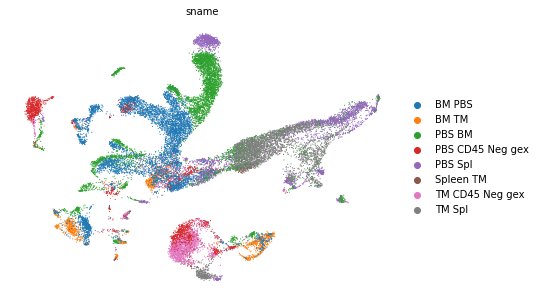

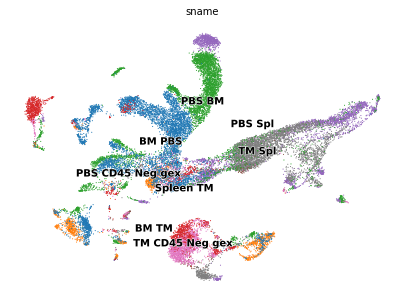

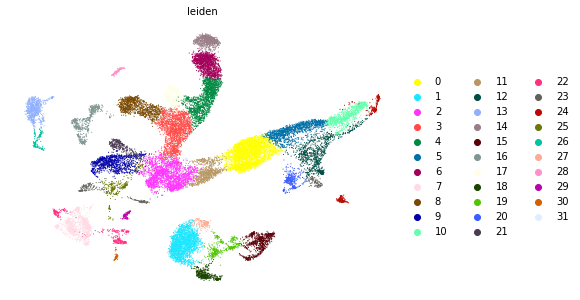

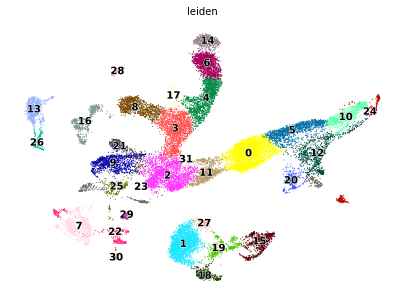

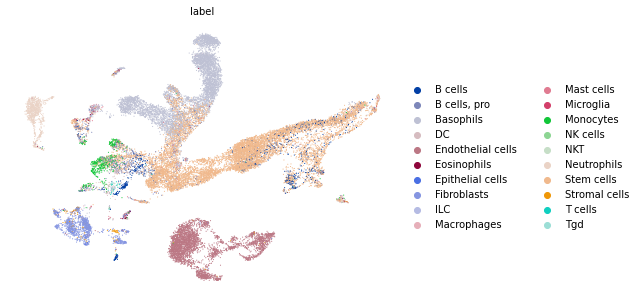

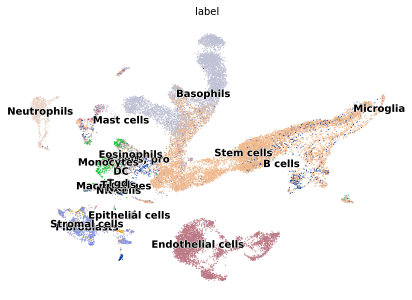

time: 2.12 s (started: 2025-03-13 11:46:33 +01:00)


In [36]:
for name in ['sname', 'leiden', 'label']:
    scv.pl.scatter(adata, color=name, figsize =(7,5), legend_loc='right margin')
    scv.pl.scatter(adata, color=name, figsize =(7,5), legend_loc='on data')

In [32]:
MT = re.compile('^[Mm][Tt]-')
RP = re.compile('^R[pP][SsLl]')

genes = [ x  for x in adata.var.index if testGene(x, MT, RP)]
adata.obs['geneSum'] = adata[:,genes].X.sum(axis=1)

adata

AnnData object with n_obs × n_vars = 27864 × 20540
    obs: 'sname', 'fname', 'n_counts', 'n_genes', 'label', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'geneSum'
    var: 'n_counts', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

time: 429 ms (started: 2025-03-13 11:42:34 +01:00)


In [15]:
dropRP( adata, True )
dropMT( adata, True )
adata

Counter({'Rpl7': 1, 'Rpl31': 1, 'Rpl37a': 1, 'Rps6kc1': 1, 'Rpl7a': 1, 'Rpl12': 1, 'Rpl35': 1, 'Rps21': 1, 'Rpl22l1': 1, 'Rps3a1': 1, 'Rps27': 1, 'Rpl34': 1, 'Rps20': 1, 'Rps6': 1, 'Rps8': 1, 'Rps6ka1': 1, 'Rpl11': 1, 'Rpl22': 1, 'Rpl9': 1, 'Rpl5': 1, 'Rplp0': 1, 'Rpl6': 1, 'Rpl21': 1, 'Rpl32': 1, 'Rps9': 1, 'Rpl28': 1, 'Rps5': 1, 'Rps19': 1, 'Rps16': 1, 'Rps11': 1, 'Rpl13a': 1, 'Rpl18': 1, 'Rps17': 1, 'Rps3': 1, 'Rpl27a': 1, 'Rps13': 1, 'Rps15a': 1, 'Rplp2': 1, 'Rpl18a': 1, 'Rpl13': 1, 'Rps25': 1, 'Rpl10-ps3': 1, 'Rplp1': 1, 'Rpl4': 1, 'Rps27l': 1, 'Rpl29': 1, 'Rps27rt': 1, 'Rpsa': 1, 'Rpl14': 1, 'Rps12': 1, 'Rps15': 1, 'Rpl41': 1, 'Rps26': 1, 'Rps27a': 1, 'Rpl26': 1, 'Rpl23a': 1, 'Rpl9-ps1': 1, 'Rps6kb1': 1, 'Rpl23': 1, 'Rpl19': 1, 'Rpl27': 1, 'Rpl38': 1, 'Rps7': 1, 'Rpl10l': 1, 'Rps29': 1, 'Rpl36al': 1, 'Rps6kl1': 1, 'Rps6ka5': 1, 'Rps23': 1, 'Rpl15': 1, 'Rps24': 1, 'Rpl36a-ps1': 1, 'Rpl37': 1, 'Rpl30': 1, 'Rpl8': 1, 'Rpl3': 1, 'Rps19bp1': 1, 'Rpl39l': 1, 'Rpl35a': 1, 'Rpl24': 1, 'R

AnnData object with n_obs × n_vars = 28530 × 32171
    obs: 'sname', 'fname', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'geneSum', 'RP[LS]sum', 'MTsum'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

time: 1.25 s (started: 2025-02-25 08:24:32 +01:00)


In [16]:
adata = adata[ adata.obs['geneSum'] > 1000]
adata

View of AnnData object with n_obs × n_vars = 25650 × 32171
    obs: 'sname', 'fname', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'geneSum', 'RP[LS]sum', 'MTsum'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

time: 4.51 ms (started: 2025-02-25 08:24:33 +01:00)


In [17]:
scanpy.pp.filter_cells(adata, min_genes=100 )
adata

AnnData object with n_obs × n_vars = 25637 × 32171
    obs: 'sname', 'fname', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'geneSum', 'RP[LS]sum', 'MTsum', 'n_genes'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

time: 620 ms (started: 2025-02-25 08:24:34 +01:00)


In [18]:
scanpy.pp.downsample_counts(adata, counts_per_cell= 1000 )
scanpy.pp.filter_genes(adata, min_counts=1 )
adata

AnnData object with n_obs × n_vars = 25637 × 22345
    obs: 'sname', 'fname', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'geneSum', 'RP[LS]sum', 'MTsum', 'n_genes'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts'

time: 5.33 s (started: 2025-02-25 08:24:34 +01:00)


In [36]:
Counter(adata.obs['sname'])

Counter({'BM_PBS': 6082,
         'PBS_BM': 5181,
         'TM_Spl': 4792,
         'PBS_Spl': 3747,
         'TM_CD45_Neg_gex': 2249,
         'BM_TM': 1693,
         'PBS_CD45_Neg_gex': 1464,
         'Spleen_TM': 429})

time: 3.07 ms (started: 2025-02-25 08:26:17 +01:00)


In [19]:
scv.pp.log1p(adata)
scanpy.pp.highly_variable_genes(adata, n_top_genes=300)
print ( Counter( adata.var['highly_variable']))

Counter({False: 22044, True: 301})
time: 396 ms (started: 2025-02-25 08:24:39 +01:00)


In [20]:
scanpy.pp.neighbors(adata)
dimensions = 2
scanpy.tl.umap(adata,n_components= dimensions)


         Falling back to preprocessing with `sc.pp.pca` and default params.
time: 1min 24s (started: 2025-02-25 08:24:40 +01:00)


In [21]:
scanpy.tl.leiden(adata)

time: 6.58 s (started: 2025-02-25 08:26:05 +01:00)


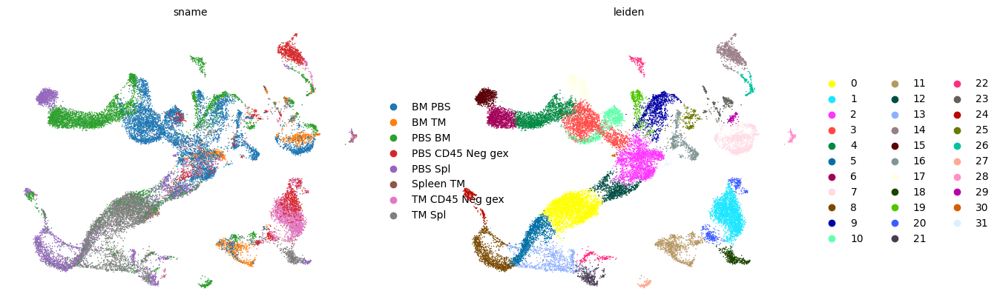

time: 1.05 s (started: 2025-02-25 08:26:11 +01:00)


In [22]:
scv.pl.scatter(adata, color=['sname', 'leiden'], figsize =(7,5), legend_loc='right margin')

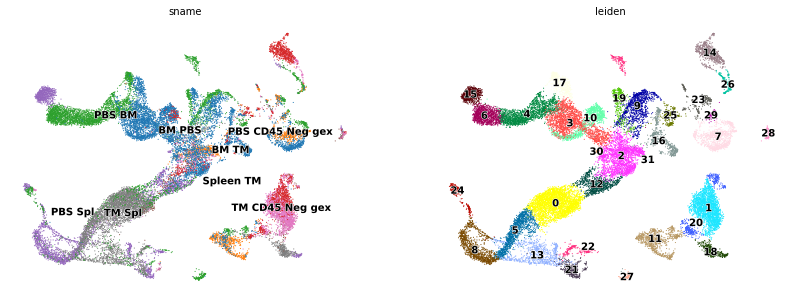

time: 510 ms (started: 2025-02-25 08:26:12 +01:00)


In [23]:
scv.pl.scatter(adata, color=['sname', 'leiden'], figsize =(7,5), legend_loc='on data')

In [24]:
Counter(adata.obs['leiden'])

Counter({'0': 3103,
         '1': 2204,
         '2': 2040,
         '3': 1840,
         '4': 1720,
         '5': 1265,
         '6': 1127,
         '7': 1065,
         '8': 1043,
         '9': 999,
         '10': 974,
         '11': 871,
         '12': 849,
         '13': 809,
         '14': 725,
         '15': 717,
         '16': 595,
         '17': 526,
         '18': 420,
         '20': 381,
         '19': 381,
         '21': 343,
         '22': 318,
         '23': 294,
         '24': 253,
         '25': 230,
         '26': 163,
         '27': 130,
         '28': 112,
         '29': 102,
         '30': 22,
         '31': 16})

time: 3 ms (started: 2025-02-25 08:26:13 +01:00)


In [25]:
cluster_sizes = adata.obs['leiden'].value_counts()
small_clusters = cluster_sizes[cluster_sizes < 100].index
adata_filtered = adata[~adata.obs['leiden'].isin(small_clusters)]

time: 6.56 ms (started: 2025-02-25 08:26:13 +01:00)


In [26]:
pivot = adata_filtered.obs.pivot_table( values="n_genes", index="leiden", columns="sname", aggfunc="count")
pivot

sname,BM_PBS,BM_TM,PBS_BM,PBS_CD45_Neg_gex,PBS_Spl,Spleen_TM,TM_CD45_Neg_gex,TM_Spl
leiden,,,,,,,,
0,4,0,226,0,254,35,8,2576
1,0,0,0,455,0,91,1658,0
2,1177,482,15,100,21,95,150,0
3,1726,6,51,3,16,17,11,10
4,40,0,1662,0,16,0,0,2
5,0,0,35,0,389,1,1,839
6,2,0,1090,0,34,0,0,1
7,517,433,114,0,0,1,0,0
8,1,0,27,0,944,0,0,71


time: 29.6 ms (started: 2025-02-25 08:26:13 +01:00)


In [27]:
def scale_values(row):
    total_sum=sum(row)
    scaled_values = {key: value*100 /total_sum for key, value in row.items() }
    return scaled_values

time: 303 µs (started: 2025-02-25 08:26:13 +01:00)


In [28]:
pivot_scaled = pivot.apply( scale_values, axis = 1, result_type="expand")
pivot_scaled

,BM_PBS,BM_TM,PBS_BM,PBS_CD45_Neg_gex,PBS_Spl,Spleen_TM,TM_CD45_Neg_gex,TM_Spl
leiden,,,,,,,,
0,0.128908,0.000000,7.283274,0.000000,8.185627,1.127941,0.257815,83.016436
1,0.000000,0.000000,0.000000,20.644283,0.000000,4.128857,75.226860,0.000000
2,57.696078,23.627451,0.735294,4.901961,1.029412,4.656863,7.352941,0.000000
3,93.804348,0.326087,2.771739,0.163043,0.869565,0.923913,0.597826,0.543478
4,2.325581,0.000000,96.627907,0.000000,0.930233,0.000000,0.000000,0.116279
5,0.000000,0.000000,2.766798,0.000000,30.750988,0.079051,0.079051,66.324111
6,0.177462,0.000000,96.716948,0.000000,3.016859,0.000000,0.000000,0.088731
7,48.544601,40.657277,10.704225,0.000000,0.000000,0.093897,0.000000,0.000000
8,0.095877,0.000000,2.588686,0.000000,90.508150,0.000000,0.000000,6.807287


time: 13.3 ms (started: 2025-02-25 08:26:13 +01:00)


In [29]:
pivot_scaled.corr()

,BM_PBS,BM_TM,PBS_BM,PBS_CD45_Neg_gex,PBS_Spl,Spleen_TM,TM_CD45_Neg_gex,TM_Spl
BM_PBS,1.000000,0.154623,-0.190906,-0.138017,-0.387556,-0.140663,-0.218756,-0.347917
BM_TM,0.154623,1.000000,-0.114251,-0.065292,-0.287152,-0.077503,-0.109853,-0.231146
PBS_BM,-0.190906,-0.114251,1.000000,-0.236504,-0.244840,-0.280206,-0.249100,-0.284198
PBS_CD45_Neg_gex,-0.138017,-0.065292,-0.236504,1.000000,-0.207457,0.091716,0.417565,-0.190695
PBS_Spl,-0.387556,-0.287152,-0.244840,-0.207457,1.000000,-0.040324,-0.193957,0.103291
Spleen_TM,-0.140663,-0.077503,-0.280206,0.091716,-0.040324,1.000000,0.438599,0.024112
TM_CD45_Neg_gex,-0.218756,-0.109853,-0.249100,0.417565,-0.193957,0.438599,1.000000,-0.163407
TM_Spl,-0.347917,-0.231146,-0.284198,-0.190695,0.103291,0.024112,-0.163407,1.000000


time: 5.34 ms (started: 2025-02-25 08:26:13 +01:00)


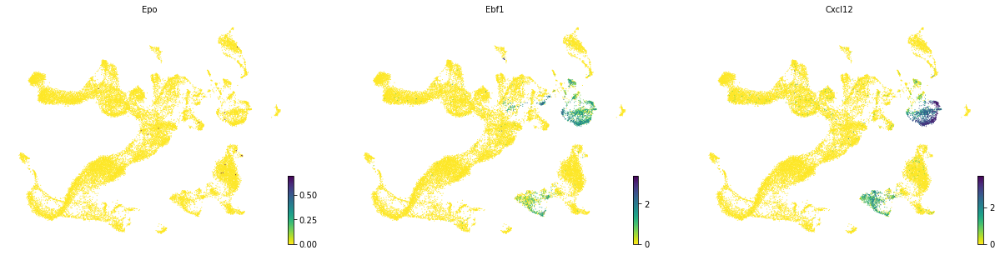

time: 917 ms (started: 2025-02-25 08:26:13 +01:00)


In [30]:
scv.pl.scatter(adata_filtered, color=['Epo', 'Ebf1', "Cxcl12"], figsize =(7,5), legend_loc='right margin', cmap="viridis_r",)

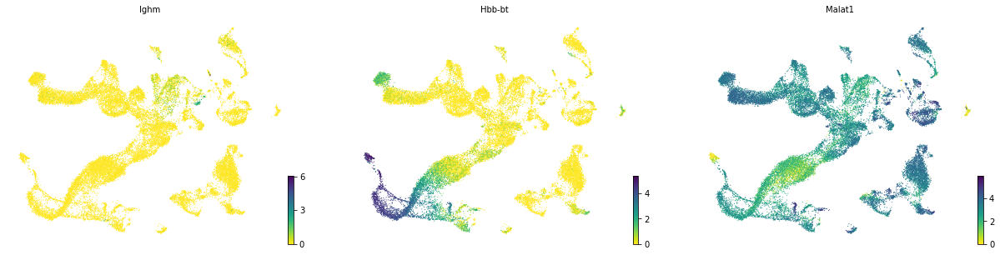

time: 546 ms (started: 2025-02-25 08:26:14 +01:00)


In [31]:
scv.pl.scatter(adata, color=['Ighm', "Hbb-bt", "Malat1"], figsize =(7,5), legend_loc='right margin', cmap="viridis_r",)

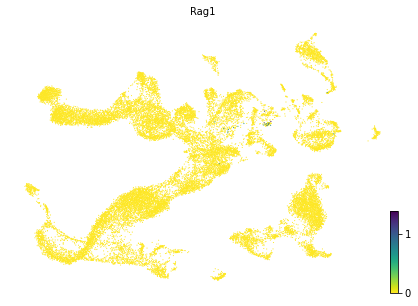

time: 185 ms (started: 2025-02-25 08:26:14 +01:00)


In [32]:
scv.pl.scatter(adata, color=['Rag1'], figsize =(7,5), legend_loc='right margin', cmap="viridis_r",)

In [33]:
hb = re.compile('Hb[abcd]*')

time: 351 µs (started: 2025-02-25 08:26:15 +01:00)


In [34]:
hems = [name for name in adata.var_names if hb.match(name)]
hems

['Hbb-bt',
 'Hbb-bs',
 'Hbb-bh1',
 'Hbb-y',
 'Hbs1l',
 'Hba-x',
 'Hba-a1',
 'Hbq1b',
 'Hba-a2',
 'Hbq1a',
 'Hbp1',
 'Hbegf']

time: 5.74 ms (started: 2025-02-25 08:26:15 +01:00)


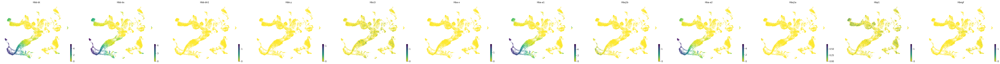

time: 2.15 s (started: 2025-02-25 08:26:15 +01:00)


In [35]:
scv.pl.scatter(adata, color=hems, figsize =(7,5), legend_loc='right margin', cmap="viridis_r",)

# That is what I excpected!

Lots of red cells in the two arms to the left,
Stem cells and Lymphozytes in the center bulk an something else as the small dog stiiing in the lower right corner.
The behind of the dog expresses Cxcl12 and Ebf1 - likely the cells we were really after.
But there is also Ebf1 and Cxcl12 right above the dog.

Stats it is!

# Calculate the stats for the Leiden clusters

In [39]:
def write_stats_tables( adata, key_added,cn ="leiden" ):

    scanpy.tl.rank_genes_groups(
        adata, 
        groupby   = cn,
        key_added = key_added,
        method    = 'wilcoxon',
    )

    scanpy.pl.rank_genes_groups(adata, key = key_added, save= key_added+"_overview")

    diff_results = adata.uns[key_added]
    columns = ['names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges']
    try: 
        os.mkdir(f"{key_added}") 
    except OSError as error: 
        print(error)  

    for i in adata.obs[cn].unique():
        table = {}
        for j in columns:
            #print(f"Analyszing column {diff_results[j]} {i}")
            table[j] = pd.DataFrame(diff_results[j])[str(i)]
        table = pd.DataFrame(table).to_csv(f"{key_added}/{cn}_cluster_{i}.csv")

time: 670 µs (started: 2025-02-25 08:34:21 +01:00)


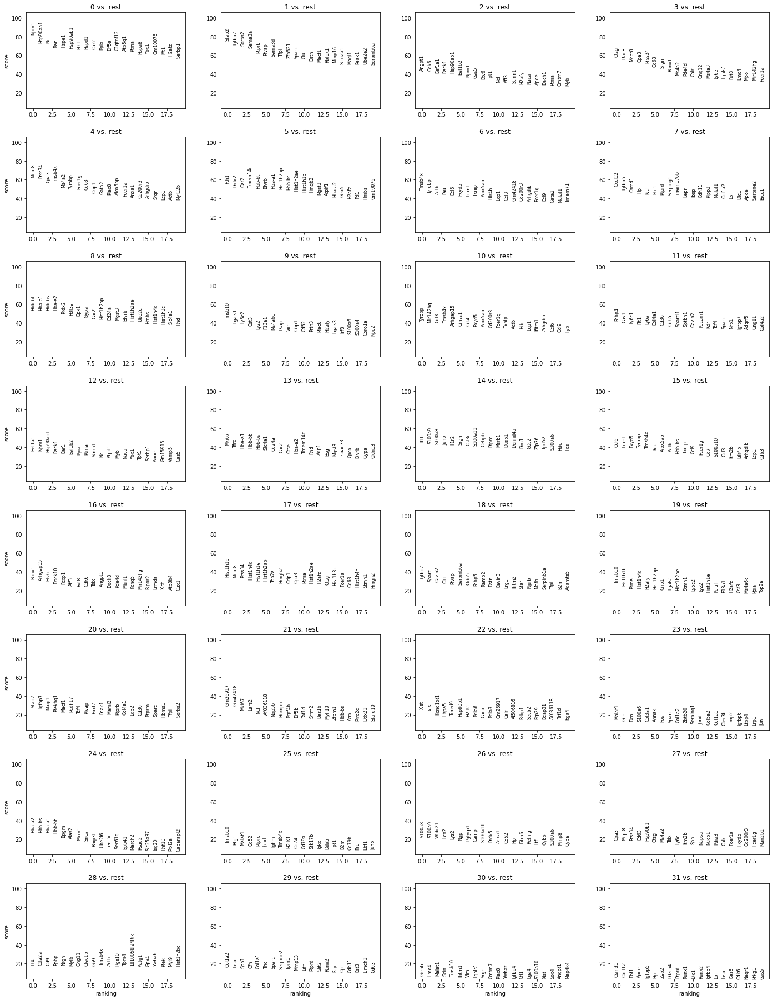

time: 30.3 s (started: 2025-02-25 08:34:21 +01:00)


In [40]:
write_stats_tables( adata, "leiden_stats_merge_all_usable")

In [41]:
def scale_values(row):
    total_sum = sum(row)
    scaled_values = {key: value * 100 / total_sum for key, value in row.items()}
    return scaled_values

time: 535 µs (started: 2025-02-25 08:36:22 +01:00)


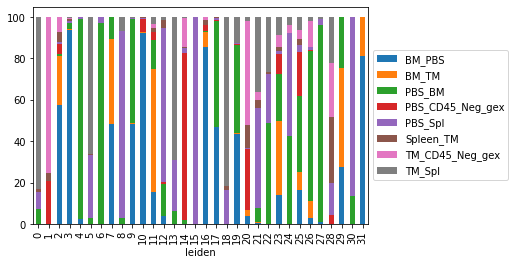

time: 1.01 s (started: 2025-02-25 08:36:50 +01:00)


In [42]:
import matplotlib.pyplot as plt
sname_tab = adata.obs.pivot_table(values = "n_genes", index = "leiden", columns="sname", aggfunc='count')
sname_tab_scaled = sname_tab.apply( scale_values, axis=1,  result_type='expand')
ax = sname_tab_scaled.plot.bar(stacked=True)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig('sname_vs_louvain_stacked_bar_plot.svg', format='svg', bbox_inches='tight')
plt.show()

In [44]:
sname_tab.to_csv("louvain_sname_counts.csv")
sname_tab_scaled.to_csv("louvain_sname_percentages.csv")


time: 5.96 ms (started: 2025-02-25 08:38:41 +01:00)


In [46]:
adata.write( ofile )

time: 453 ms (started: 2025-02-25 09:11:28 +01:00)


In [47]:
!ls -lh {ofile}

-rw-r--r-- 1 stefanl lu-shso 197M Feb 25 09:11 2025_merged_Stroma_samples.h5ad
time: 227 ms (started: 2025-02-25 09:11:37 +01:00)


In [4]:
! date

Mon Mar 17 14:22:12 CET 2025
time: 165 ms (started: 2025-03-17 14:22:12 +01:00)


In [5]:
adata = anndata.read_h5ad(ofile)
adata

AnnData object with n_obs × n_vars = 25637 × 22345
    obs: 'sname', 'fname', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'geneSum', 'RP[LS]sum', 'MTsum', 'n_genes', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_stats_merge_all_usable', 'log1p', 'neighbors', 'sname_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

time: 616 ms (started: 2025-03-17 14:22:13 +01:00)


In [6]:
cell_types = pd.read_csv('WhatCaWeDoFromHere_raw_humanized_azimuth_pred.tsv', sep="\t")
cell_types

,cell,predicted.celltype.l2,predicted.celltype.l2.score,mapping.score
0,AAACCCAAGAGATGCC-1,Early Eryth,0.295633,0.008685
1,AAACCCAAGCTCGGCT-1,Late Eryth,0.590707,0.009888
2,AAACCCAAGGGCCTCT-1,Early Eryth,0.514270,0.257345
3,AAACCCAAGTTGTAGA-1,Late Eryth,0.898754,0.071270
4,AAACCCATCCAACCAA-1,Late Eryth,0.702631,0.040739
...,...,...,...,...
24005,TTTGGAGCAAGGACAC-1,HSC,0.321395,0.060382
24006,TTTGGAGCAGTTGAAA-1,HSC,0.344160,0.115246
24007,TTTGTTGAGCTGGCCT-1,CD14 Mono,1.000000,0.474521
24008,TTTGTTGCATGACTCA-1,CD14 Mono,1.000000,0.511271


time: 57.5 ms (started: 2025-03-17 14:22:14 +01:00)


In [7]:
Counter(adata.obs_names.isin(cell_types['cell']))

Counter({True: 23996, False: 1641})

time: 8.08 ms (started: 2025-03-17 14:22:15 +01:00)


In [8]:
adata.obs =  adata.obs.merge( cell_types, left_on=None, right_on="cell", left_index=True, right_index=False, how="left")

time: 13 ms (started: 2025-03-17 14:22:16 +01:00)


In [9]:
adata.obs['predicted.celltype.l2'] = adata.obs['predicted.celltype.l2'].astype('category')

time: 1.96 ms (started: 2025-03-17 14:22:17 +01:00)


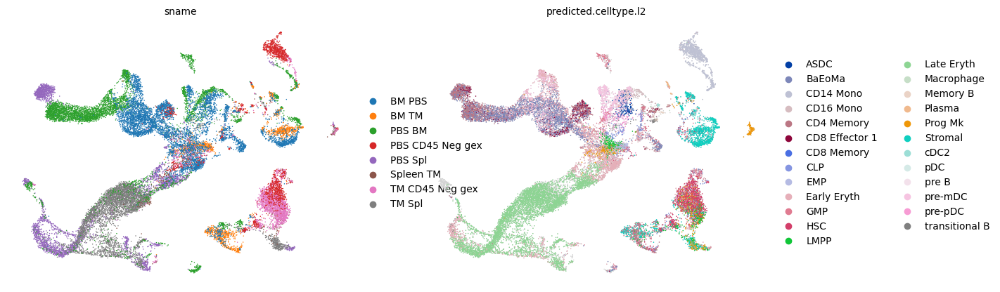

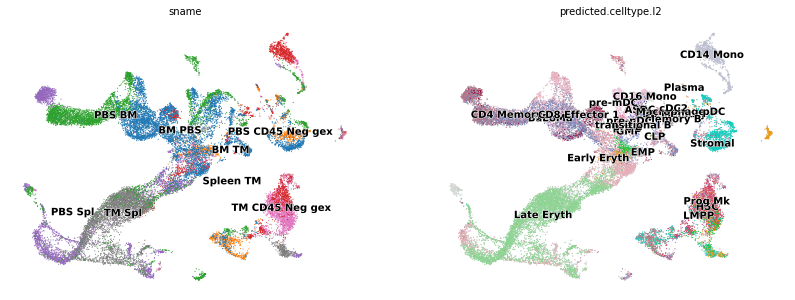

time: 2.23 s (started: 2025-03-17 14:22:17 +01:00)


In [10]:
scv.pl.scatter(adata, color=['sname', 'predicted.celltype.l2'], figsize =(7,5), legend_loc='right margin')
scv.pl.scatter(adata, color=['sname', 'predicted.celltype.l2'], figsize =(7,5), legend_loc='on data')


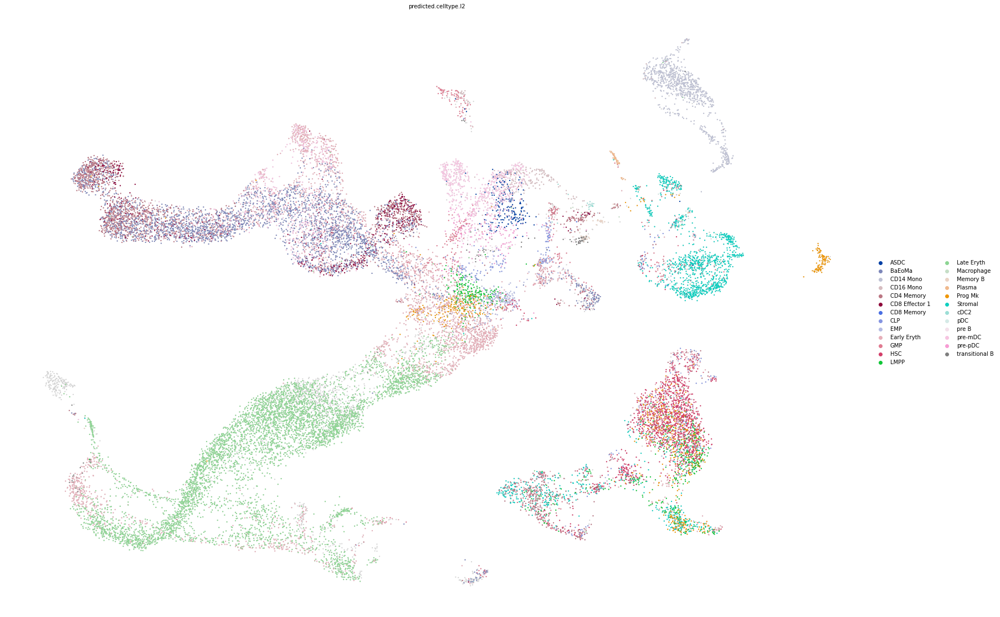

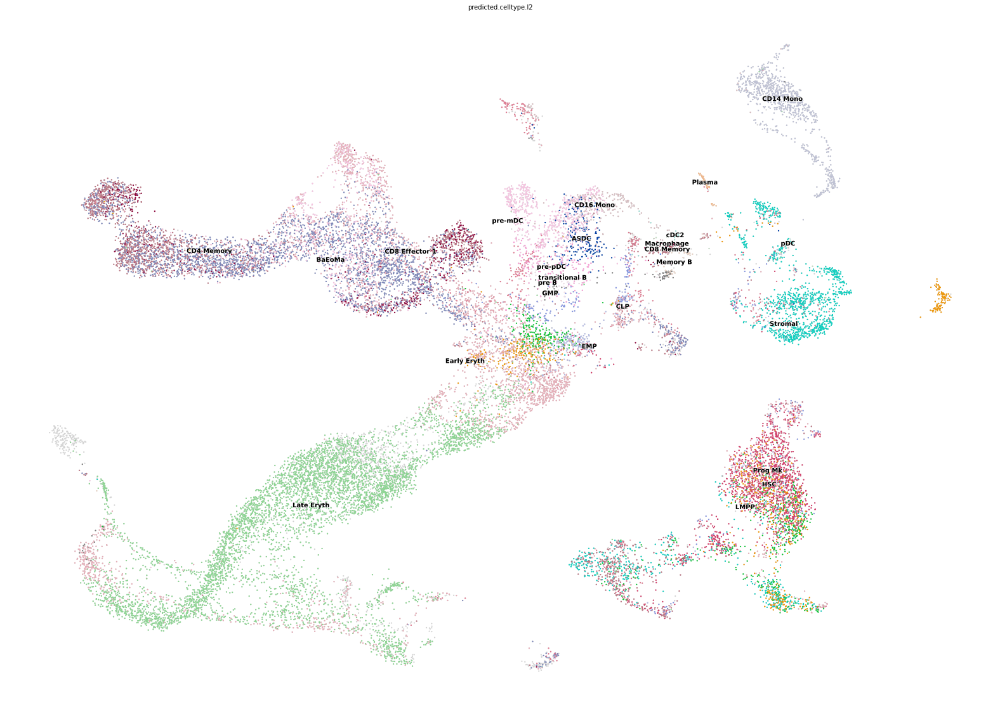

time: 1.64 s (started: 2025-03-17 14:22:19 +01:00)


In [11]:
scv.pl.scatter(adata, color=['predicted.celltype.l2'], figsize =(28,20), legend_loc='right margin', size=20)
scv.pl.scatter(adata, color=['predicted.celltype.l2'], figsize =(28,20), legend_loc='on data', size=20)

In [12]:
Counter( adata.obs['predicted.celltype.l2'] )

Counter({'Late Eryth': 5943,
         'Early Eryth': 3443,
         'BaEoMa': 3004,
         'CD4 Memory': 2123,
         'Stromal': 1656,
         nan: 1641,
         'HSC': 1477,
         'pre-mDC': 1300,
         'CD14 Mono': 874,
         'Prog Mk': 818,
         'LMPP': 668,
         'GMP': 577,
         'CD8 Effector_1': 511,
         'EMP': 391,
         'CLP': 289,
         'CD16 Mono': 251,
         'ASDC': 199,
         'pre-pDC': 184,
         'transitional B': 98,
         'Plasma': 53,
         'pre B': 52,
         'Memory B': 41,
         'cDC2': 20,
         'pDC': 15,
         'Macrophage': 7,
         'CD8 Memory': 2})

time: 7.48 ms (started: 2025-03-17 14:22:21 +01:00)


In [13]:
tmp = adata.obs['predicted.celltype.l2'].astype('str').copy()

time: 1.49 ms (started: 2025-03-17 14:22:21 +01:00)


In [19]:
tmp = tmp.fillna('unknown')
tmp

0.0        Early Eryth
1.0         Late Eryth
2.0        Early Eryth
3.0         Late Eryth
4.0         Late Eryth
              ...     
24006.0            HSC
24007.0      CD14 Mono
NaN                nan
24008.0      CD14 Mono
24009.0            HSC
Name: predicted.celltype.l2, Length: 25637, dtype: object

time: 4.49 ms (started: 2025-03-17 14:23:12 +01:00)


In [20]:
adata.obs['predicted.celltype.l2'] = tmp.astype('category')
Counter(adata.obs['predicted.celltype.l2'])

Counter({'Late Eryth': 5943,
         'Early Eryth': 3443,
         'BaEoMa': 3004,
         'CD4 Memory': 2123,
         'Stromal': 1656,
         'nan': 1641,
         'HSC': 1477,
         'pre-mDC': 1300,
         'CD14 Mono': 874,
         'Prog Mk': 818,
         'LMPP': 668,
         'GMP': 577,
         'CD8 Effector_1': 511,
         'EMP': 391,
         'CLP': 289,
         'CD16 Mono': 251,
         'ASDC': 199,
         'pre-pDC': 184,
         'transitional B': 98,
         'Plasma': 53,
         'pre B': 52,
         'Memory B': 41,
         'cDC2': 20,
         'pDC': 15,
         'Macrophage': 7,
         'CD8 Memory': 2})

time: 4.75 ms (started: 2025-03-17 14:23:17 +01:00)


In [21]:
adata.obs['predicted.celltype.l2'].unique()

['Early Eryth', 'Late Eryth', 'nan', 'CD16 Mono', 'CD4 Memory', ..., 'pre-pDC', 'Macrophage', 'pDC', 'CLP', 'CD8 Memory']
Length: 26
Categories (26, object): ['ASDC', 'BaEoMa', 'CD14 Mono', 'CD16 Mono', ..., 'pre B', 'pre-mDC', 'pre-pDC', 'transitional B']

time: 2.75 ms (started: 2025-03-17 14:23:38 +01:00)


In [33]:
for name in adata.obs['predicted.celltype.l2'].unique():
    tmp = adata[adata.obs.loc[adata.obs['predicted.celltype.l2'].astype(str) == str(name)]]
    
    scv.pl.scatter( tmp, color=['sname', 'predicted.celltype.l2'], figsize =(7,5), legend_loc='right margin')
    scv.pl.scatter( tmp, color=['sname', 'predicted.celltype.l2'], figsize =(7,5), legend_loc='on data')

AssertionError: Don’t call _normalize_index with non-categorical/string names

time: 50.9 ms (started: 2025-03-17 14:31:09 +01:00)


In [10]:
cell_types = pd.read_csv('WhatCaWeDoFromHere_raw_humanized_azimuth_pred.tsv', sep="\t")
cell_types

,cell,predicted.celltype.l2,predicted.celltype.l2.score,mapping.score
0,AAACCCAAGAGATGCC-1,Early Eryth,0.295633,0.008685
1,AAACCCAAGCTCGGCT-1,Late Eryth,0.590707,0.009888
2,AAACCCAAGGGCCTCT-1,Early Eryth,0.514270,0.257345
3,AAACCCAAGTTGTAGA-1,Late Eryth,0.898754,0.071270
4,AAACCCATCCAACCAA-1,Late Eryth,0.702631,0.040739
...,...,...,...,...
24005,TTTGGAGCAAGGACAC-1,HSC,0.321395,0.060382
24006,TTTGGAGCAGTTGAAA-1,HSC,0.344160,0.115246
24007,TTTGTTGAGCTGGCCT-1,CD14 Mono,1.000000,0.474521
24008,TTTGTTGCATGACTCA-1,CD14 Mono,1.000000,0.511271


time: 66.2 ms (started: 2025-03-18 08:40:04 +01:00)


In [11]:
adata

AnnData object with n_obs × n_vars = 27864 × 20540
    obs: 'sname', 'fname', 'n_counts', 'n_genes', 'label'
    var: 'n_counts', 'n_cells'

time: 1.54 ms (started: 2025-03-18 08:40:07 +01:00)


In [12]:
adata.obs =  adata.obs.merge( cell_types, left_on=None, right_on="cell", left_index=True, right_index=False, how="left")
Counter( adata.obs['predicted.celltype.l2'] )

Counter({'Late Eryth': 5914,
         nan: 3854,
         'Early Eryth': 3453,
         'BaEoMa': 3004,
         'CD4 Memory': 2125,
         'Stromal': 1662,
         'HSC': 1489,
         'pre-mDC': 1301,
         'CD14 Mono': 881,
         'Prog Mk': 821,
         'LMPP': 673,
         'GMP': 575,
         'CD8 Effector_1': 512,
         'EMP': 390,
         'CLP': 289,
         'CD16 Mono': 251,
         'ASDC': 199,
         'pre-pDC': 184,
         'transitional B': 97,
         'Plasma': 53,
         'pre B': 52,
         'Memory B': 41,
         'cDC2': 20,
         'pDC': 15,
         'Macrophage': 7,
         'CD8 Memory': 2})

time: 25.9 ms (started: 2025-03-18 08:41:00 +01:00)


In [14]:
adata.obs['predicted.celltype.l2'] = adata.obs['predicted.celltype.l2'].fillna('Unknown')

time: 3.76 ms (started: 2025-03-18 08:42:21 +01:00)


In [15]:
adata.obs['predicted.celltype.l2'] = adata.obs['predicted.celltype.l2'].astype('category')

time: 4.37 ms (started: 2025-03-18 08:42:42 +01:00)


In [17]:
adata.write(raw)
! ls -lh {raw}

-rw-r--r-- 1 stefanl lu-shso 619M Mar 18 08:43 WhatCaWeDoFromHere_raw.h5ad
time: 647 ms (started: 2025-03-18 08:43:15 +01:00)


In [5]:
adata=anndata.read( raw )
adata

AnnData object with n_obs × n_vars = 27864 × 20540
    obs: 'sname', 'fname', 'n_counts', 'n_genes', 'label', 'cell', 'predicted.celltype.l2', 'predicted.celltype.l2.score', 'mapping.score'
    var: 'n_counts', 'n_cells'

time: 367 ms (started: 2025-08-27 08:49:21 +02:00)


In [4]:
import sys
sys.path.append('/home/stefanl/import/')
if "functions" in sys.modules:
    print("Removinf old functions module")
    del sys.modules['functions']
import functions

time: 68.9 ms (started: 2025-08-27 09:13:27 +02:00)


In [5]:
adata= functions.preprocess( adata )
adata

[INFO] QC metrics calculated.
[INFO] Retained 20428 genes after MT/RP filtering.
[INFO] Remaining cells after filtering: 25594
[INFO] Normalization & log-transformation done.
[INFO] Selected 300 highly variable genes.
         Falling back to preprocessing with `sc.pp.pca` and default params.
[INFO] UMAP computed with 2 dimensions.
[INFO] Leiden clustering done (resolution=1).


AnnData object with n_obs × n_vars = 25594 × 19738
    obs: 'sname', 'fname', 'n_counts', 'n_genes', 'label', 'cell', 'predicted.celltype.l2', 'predicted.celltype.l2.score', 'mapping.score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'geneSum', 'leiden'
    var: 'n_counts', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

time: 1min 43s (started: 2025-08-27 09:13:28 +02:00)


In [6]:
adata.obsm['X_umap']

array([[-13.313758  ,   0.5814714 ],
       [-11.274562  ,  -0.63951594],
       [-10.06798   ,   5.9680037 ],
       ...,
       [ -0.24138217,  12.444619  ],
       [ 12.461958  ,  -0.9774076 ],
       [ -1.5809509 ,  16.376135  ]], dtype=float32)

time: 3.25 ms (started: 2025-08-27 09:15:55 +02:00)


saving figure to file ./figures/scvelo__all_data_new_leiden.svg


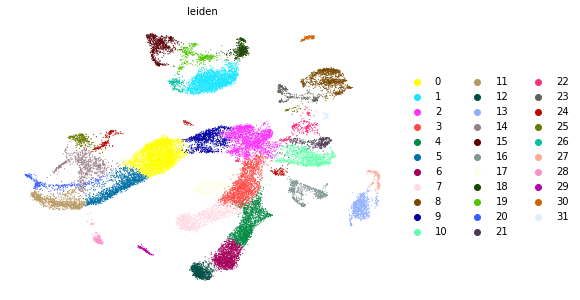

time: 2.07 s (started: 2025-08-27 09:16:14 +02:00)


In [7]:
experiment="all_data"
scv.pl.scatter(adata, color=[ 'leiden'], figsize =(7,5), legend_loc='right margin', save=f"_{experiment}_new_leiden.svg")

saving figure to file ./figures/scvelo__all_data_new_leiden.svg


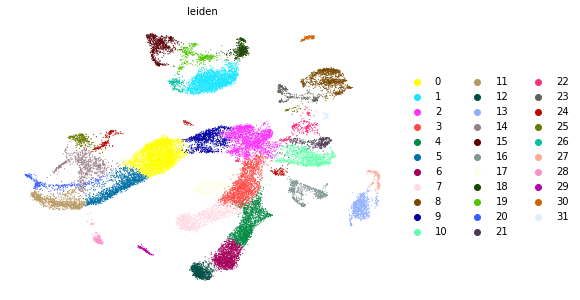

time: 2.4 s (started: 2025-08-27 08:51:43 +02:00)


In [8]:
experiment="all_data"
scv.pl.scatter(adata, color=[ 'leiden'], figsize =(7,5), legend_loc='right margin', save=f"_{experiment}_new_leiden.svg")

saving figure to file ./figures/scvelo__all_data_leiden.svg


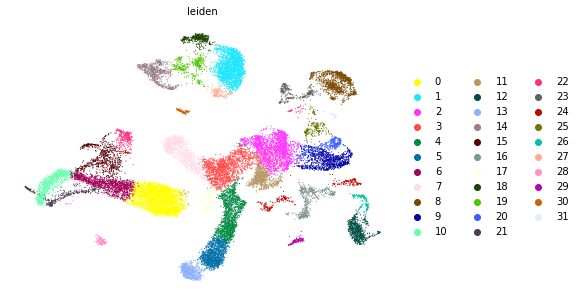

time: 2.02 s (started: 2025-08-26 13:48:35 +02:00)


In [18]:
experiment="all_data"
scv.pl.scatter(adata, color=[ 'leiden'], figsize =(7,5), legend_loc='right margin', save=f"_{experiment}_leiden.svg")


In [28]:
adata.var_names_make_unique()

time: 1.19 ms (started: 2025-08-26 13:54:33 +02:00)


In [12]:
Counter( adata.obs['leiden'])

Counter({'0': 3049,
         '1': 2186,
         '2': 1927,
         '3': 1690,
         '4': 1534,
         '5': 1312,
         '6': 1307,
         '7': 1136,
         '8': 1051,
         '9': 991,
         '10': 969,
         '11': 887,
         '12': 727,
         '13': 726,
         '14': 714,
         '15': 711,
         '16': 580,
         '17': 537,
         '18': 423,
         '19': 393,
         '20': 342,
         '21': 339,
         '22': 328,
         '23': 326,
         '25': 322,
         '24': 322,
         '26': 162,
         '27': 161,
         '28': 143,
         '29': 129,
         '30': 111,
         '31': 59})

time: 3.91 ms (started: 2025-08-27 08:54:50 +02:00)


In [23]:
Counter( adata.obs['leiden'])

Counter({'0': 3074,
         '1': 2188,
         '2': 2046,
         '3': 1688,
         '4': 1555,
         '5': 1288,
         '6': 1286,
         '7': 1131,
         '8': 1051,
         '9': 971,
         '10': 889,
         '11': 874,
         '13': 726,
         '12': 726,
         '14': 711,
         '15': 700,
         '16': 587,
         '17': 537,
         '18': 423,
         '19': 393,
         '20': 386,
         '21': 342,
         '22': 336,
         '23': 326,
         '24': 322,
         '25': 275,
         '26': 161,
         '27': 160,
         '28': 143,
         '29': 129,
         '30': 111,
         '31': 59})

time: 3.72 ms (started: 2025-08-26 13:51:14 +02:00)


In [13]:
adata.obs_names= adata.obs['cell']

time: 2.86 ms (started: 2025-08-27 08:55:07 +02:00)


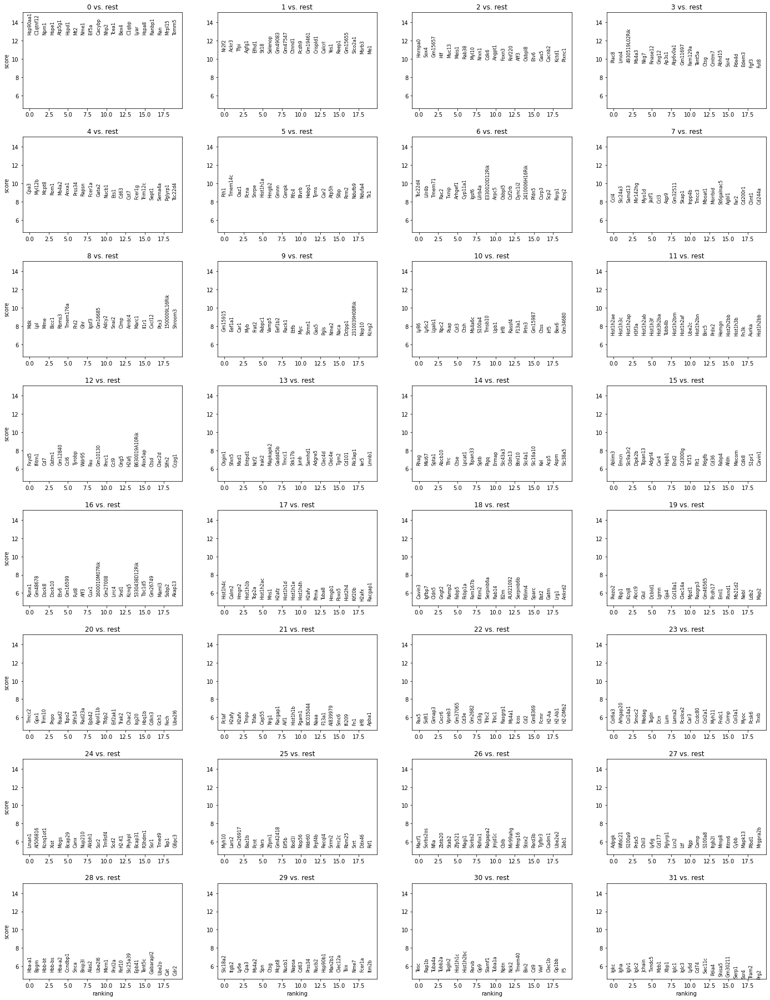

Pseudo-bulk DE analysis complete. Results stored under adata.uns['pseudo_bulk_DE']['Pseudobulk_leiden_stats'].
time: 11.6 s (started: 2025-08-27 08:55:07 +02:00)


In [14]:
functions.write_pseudobulk_stats_tables( adata, key_added="Pseudobulk_leiden_stats" ,cluster_key="leiden", )

In [ ]:
top_genes= functions.write_top_genes_per_cluster( adata, "Pseudobulk_leiden_stats", n_top_genes=30 )
top_genes

In [11]:
predicted_celltypes = {
    "0": "Metabolic/Stress-Response Cells (High Hsp, Mitochondrial Genes)",
    "1": "Perivascular Stromal Cells (Nr2f2, Ackr3, Met)",
    "2": "Early Hematopoietic Progenitors (Sox4, Meis1, Hlf)",
    "3": "Granulocyte Precursors / Immature Myeloid Cells (Plac8, Ms4a3, Ctsg)",
    "4": "Mast Cells (Cpa3, Mcpt8, Fcer1a, Gata2)",
    "5": "Proliferating Cells (Cell Cycle, Histones, Pcna, Mcm7)",
    "6": "Monocytes/Macrophages (Lilrb4a, Rac2, Txnip, Csf2rb)",
    "7": "Activated T/NK-like Cells (Ccl3, Ccl4, Cd244a)",
    "8": "Fibroblasts / Stromal Cells (Mdk, Lpl, Snai2, Col8a1)",
    "9": "Erythroid Progenitors (Myb, Hbb-like Expression)",
    "10": "Monocytes / Dendritic Cells (Ly6c2, Irf8, Ctss)",
    "11": "Erythroblasts (Strong Histone Expression, Mitosis)",
    "12": "Inflammatory Myeloid Cells (Ifitm1, Tyrobp, Alox5ap, C3ar1)",
    "13": "Inflammatory Macrophages (Ncf2, Clec4d, Tgm2)",
    "14": "Erythroid Precursors (Rhag, Spta1, Tfrc, Slc4a1)",
    "15": "Endothelial Cells (Emcn, Cd36, Pdgfb, Flt1)",
    "16": "Lymphoid Progenitors (Runx1, Ikzf1, Foxp1)",
    "17": "Highly Proliferative Cells (Histone Cluster, Cell Cycle Genes)",
    "18": "Endothelial / Pericyte-like (Cldn5, Cavin3, Igfbp7)",
    "19": "Perivascular Smooth Muscle (Acta2+, Myh11-like, Piezo2)",
    "20": "Late Erythroid Cells (Hba-a1, Hbb, Alas2)",
    "21": "Proliferative Monocyte-like (Irf8, Psap, Histones)",
    "22": "B Cells / Plasma Cells (Pax5, Ms4a1, Cd79a)",
    "23": "Fibroblasts / Extracellular Matrix-Producing (Col1a1, Col3a1, Lum)",
    "24": "Endoplasmic Reticulum / Secretory Cells (Xist, Canx, Tap1)",
    "25": "Hematopoietic Stem/Progenitor Cells (Myh10, Prpf4b, Spen)",
    "26": "Mesenchymal Stromal Cells (Nfia, Zeb1, Tgfbr3)",
    "27": "Neutrophils (S100a8, S100a9, Lcn2, Ltf, Ngp)",
    "28": "Mature Erythroid Cells (Hba, Hbb, Fech)",
    "29": "Basophils / Mast Cells (Cpa3, Mcpt8, Fcer1a, Ms4a2)",
    "30": "Platelets / Megakaryocytes (Gp1bb, Vwf, Clec1b, Gp5)",
    "31": "Plasma Cells (Igkc, Igha, Xbp1, Mzb1)"
}
adata = functions.add_cell_types_from_dict( adata, 'leiden', predicted_celltypes, 'Chatty_celltype' )


time: 2.51 ms (started: 2025-08-27 09:38:10 +02:00)


saving figure to file ./figures/scvelo__all_data_new_leiden.svg


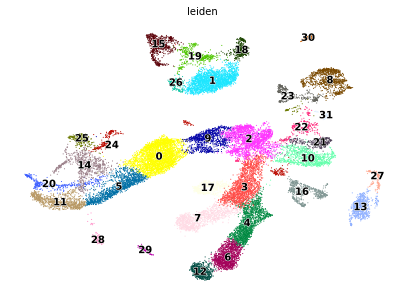

saving figure to file ./figures/scvelo__all_data_new_leiden.svg


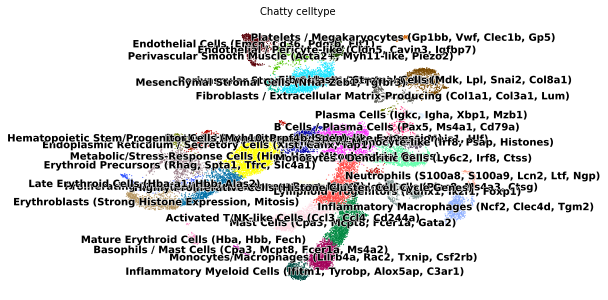

saving figure to file ./figures/scvelo__all_data_new_leiden.svg


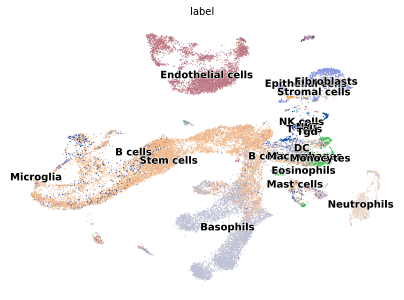

time: 4.16 s (started: 2025-08-27 09:38:16 +02:00)


In [12]:
scv.pl.scatter(adata, color=[ 'leiden'], figsize =(7,5), legend_loc='on data', save=f"_{experiment}_new_leiden.svg")
scv.pl.scatter(adata, color=[ 'Chatty_celltype'], figsize =(7,5), legend_loc='on data', save=f"_{experiment}_new_leiden.svg")
scv.pl.scatter(adata, color=[ 'label'], figsize =(7,5), legend_loc='on data', save=f"_{experiment}_new_leiden.svg")

saving figure to file ./figures/scvelo__all_data_leiden.svg


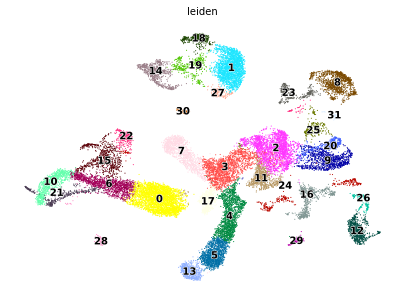

saving figure to file ./figures/scvelo__all_data_leiden.svg


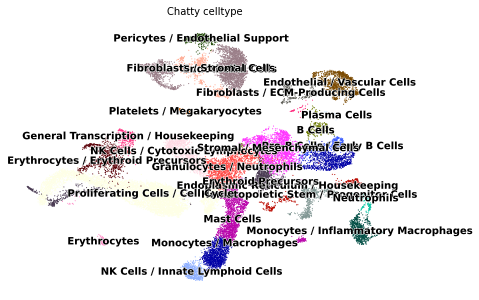

saving figure to file ./figures/scvelo__all_data_leiden.svg


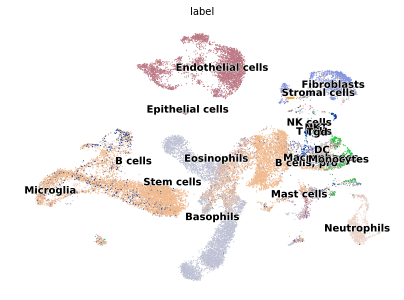

time: 3.92 s (started: 2025-08-26 14:28:31 +02:00)


In [42]:
scv.pl.scatter(adata, color=[ 'leiden'], figsize =(7,5), legend_loc='on data', save=f"_{experiment}_leiden.svg")
scv.pl.scatter(adata, color=[ 'Chatty_celltype'], figsize =(7,5), legend_loc='on data', save=f"_{experiment}_leiden.svg")
scv.pl.scatter(adata, color=[ 'label'], figsize =(7,5), legend_loc='on data', save=f"_{experiment}_leiden.svg")

saving figure to file ./figures/scvelo__all_data_new_leiden.svg


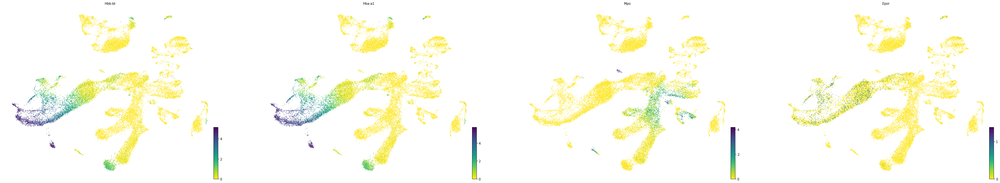

time: 4.64 s (started: 2025-08-27 09:38:32 +02:00)


In [13]:
scv.pl.scatter(adata, color=[ 'Hbb-bt', 'Hba-a1', 'Mpo', "Epor"], figsize =(14,10),size=10, legend_loc='on data', save=f"_{experiment}_new_leiden.svg", cmap="viridis_r")

saving figure to file ./figures/scvelo__all_data_leiden.svg


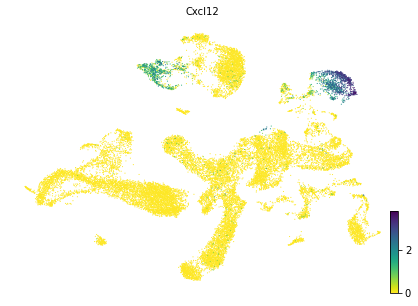

time: 1.09 s (started: 2025-08-26 14:31:58 +02:00)


In [45]:
scv.pl.scatter(adata, color=[ 'Cxcl12'], figsize =(7,5), legend_loc='on data', save=f"_{experiment}_leiden.svg", cmap="viridis_r")

saving figure to file ./figures/scvelo__all_data_new_leiden.svg


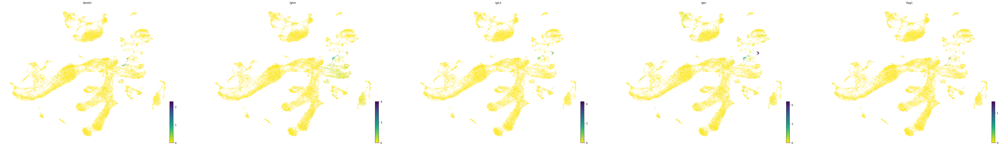

time: 6.28 s (started: 2025-08-27 09:04:55 +02:00)


In [20]:
scv.pl.scatter(adata, color=[ 'Vpreb1', 'Ighm', 'Iglc2', 'Igkc','Rag1'], figsize =(14,10),size=10, legend_loc='on data', save=f"_{experiment}_new_leiden.svg", cmap="viridis_r")

saving figure to file ./figures/scvelo__all_data_Chatty_celltype.svg


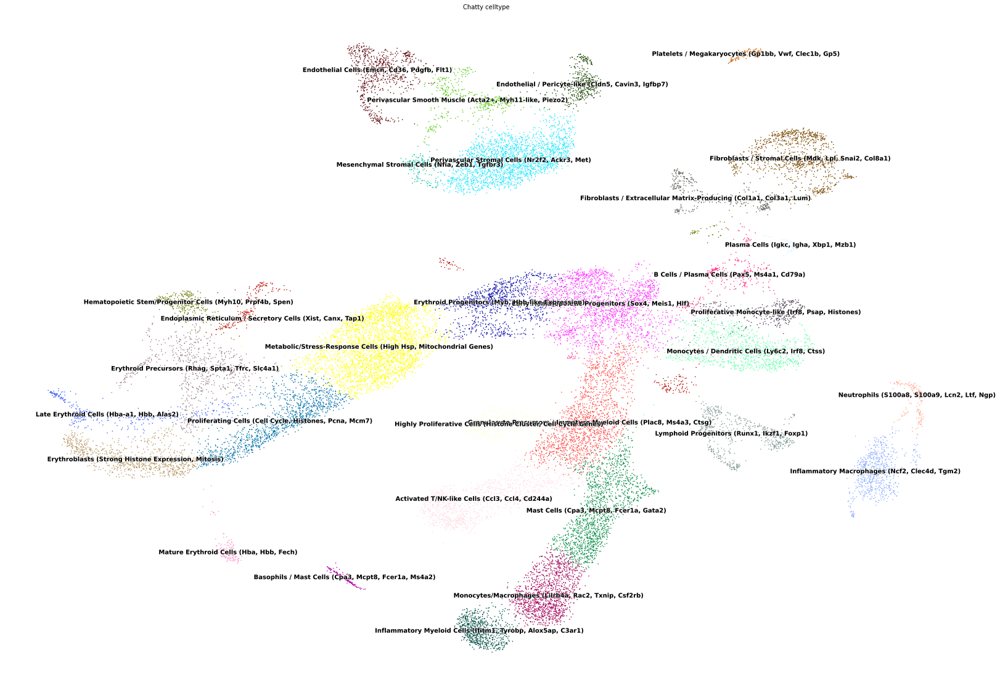

time: 1.75 s (started: 2025-08-27 09:38:43 +02:00)


In [14]:
scv.pl.scatter(adata, color=[ 'Chatty_celltype'], figsize =(28,20),size=10, legend_loc='on data', save=f"_{experiment}_Chatty_celltype.svg", cmap="viridis_r")

saving figure to file ./figures/scvelo__all_data_SingleR.svg


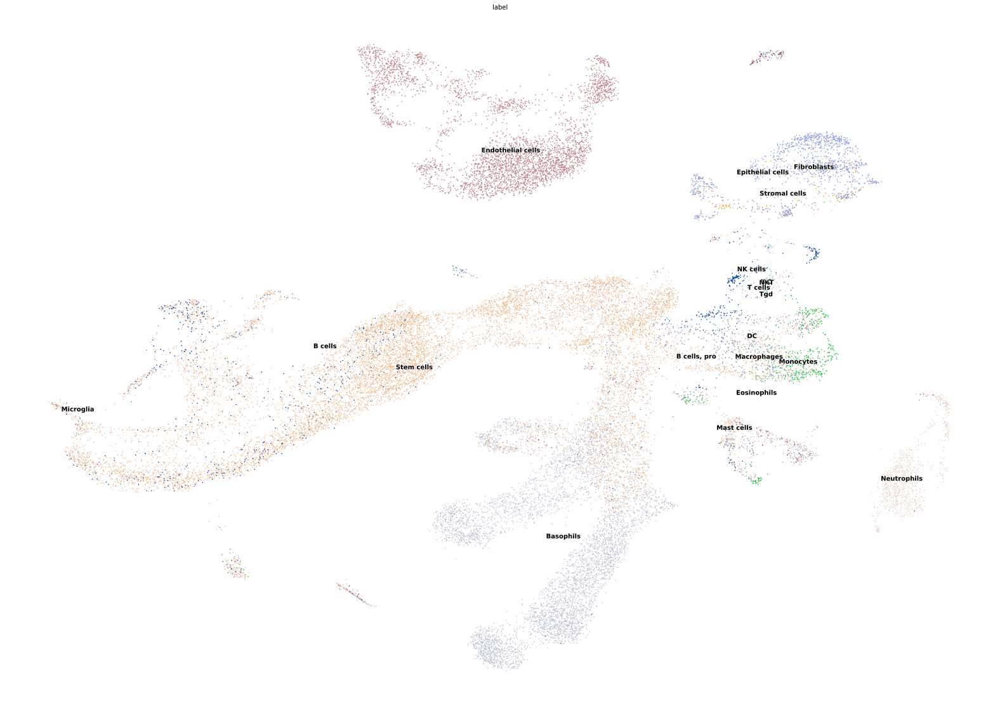

time: 1.4 s (started: 2025-08-27 09:38:45 +02:00)


In [15]:
scv.pl.scatter(adata, color=[ 'label'], figsize =(28,20),size=10, legend_loc='on data', save=f"_{experiment}_SingleR.svg", cmap="viridis_r")

saving figure to file ./figures/scvelo__all_data_leiden.svg


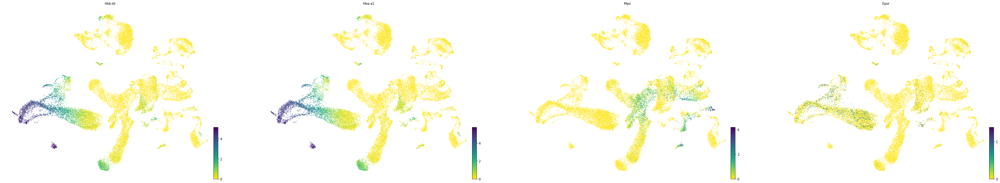

time: 4.45 s (started: 2025-08-26 15:00:19 +02:00)


In [69]:
scv.pl.scatter(adata, color=[ 'Hbb-bt', 'Hba-a1', 'Mpo', "Epor"], figsize =(14,10),size=10, legend_loc='on data', save=f"_{experiment}_leiden.svg", cmap="viridis_r")

In [63]:
hem = re.compile( 'Mll' )
hem.match("Hbb")


time: 413 µs (started: 2025-08-26 14:59:17 +02:00)


In [64]:
[ g for g in adata.var_names if hem.match(g)]

['Mllt10', 'Mllt11', 'Mllt3', 'Mllt6', 'Mllt1']

time: 5.2 ms (started: 2025-08-26 14:59:20 +02:00)


In [16]:
leiden_lineages = {
    "Myeloid": [
        "3", "4", "6", "7", "10", "12", "13", "27", "29"
    ],  # Granulocytes, Mast, Monocytes, Macrophages, Neutrophils
    "Lymphoid": [
        "16", "22", "31"
    ],  # B cells, Plasma cells, Lymphoid progenitors
    "Erythroid/Platelet": [
        "9", "11", "14", "20", "28", "30"
    ],  # Erythroid lineage & Megakaryocytes
    "Stromal/Endothelial": [
        "1", "8", "15", "18", "19", "23", "26"
    ],  # Fibroblasts, Endothelial, Pericytes, Mesenchyme
    "Progenitor/Stem/Proliferative": [
        "0", "2", "5", "16", "17", "21", "24", "25"
    ]  # Stem-like, Cycling, Secretory/ER-stress
}

base_colors = {
    "Myeloid": "#E64B35",         # reddish orange
    "Lymphoid": "#4DBBD5",        # blue-cyan
    "Erythroid/Platelet": "#F39B7F", # salmon
    "Stromal/Endothelial": "#00A087", # teal-green
    "Progenitor/Stem/Proliferative": "#3C5488" # deep blue-purple
}
leiden_colors = {}
celltype_colors = {}
for lineage, members in leiden_lineages.items():
    shades = functions.generate_distinct_shades(base_colors[lineage], len(members))
    for cell_type, shade in zip(members, shades):
        leiden_colors[cell_type] = shade
        celltype_colors[predicted_celltypes[cell_type]] = shade
print ( leiden_colors )
print ( celltype_colors )

{'3': '#a32929', '4': '#b63b29', '6': '#ca5228', '7': '#da6e2b', '10': '#e18e37', '12': '#e7ad44', '13': '#edc952', '27': '#f2e360', '29': '#f3f66f', '16': '#3773be', '22': '#41bbd8', '31': '#867ce9', '9': '#d23a3a', '11': '#db6542', '14': '#e4914c', '20': '#ebbc56', '28': '#f2e561', '30': '#e4f76e', '1': '#1eb814', '8': '#14c23e', '15': '#13cd78', '18': '#11d8b9', '19': '#10c4e2', '23': '#0f8bee', '26': '#134df3', '0': '#29a389', '2': '#2da7ac', '5': '#328eb5', '17': '#3d57c4', '21': '#5249c6', '24': '#7b56c7', '25': '#9e61c9'}
{'Granulocyte Precursors / Immature Myeloid Cells (Plac8, Ms4a3, Ctsg)': '#a32929', 'Mast Cells (Cpa3, Mcpt8, Fcer1a, Gata2)': '#b63b29', 'Monocytes/Macrophages (Lilrb4a, Rac2, Txnip, Csf2rb)': '#ca5228', 'Activated T/NK-like Cells (Ccl3, Ccl4, Cd244a)': '#da6e2b', 'Monocytes / Dendritic Cells (Ly6c2, Irf8, Ctss)': '#e18e37', 'Inflammatory Myeloid Cells (Ifitm1, Tyrobp, Alox5ap, C3ar1)': '#e7ad44', 'Inflammatory Macrophages (Ncf2, Clec4d, Tgm2)': '#edc952', 'Ne

In [17]:
adata

AnnData object with n_obs × n_vars = 25594 × 19738
    obs: 'sname', 'fname', 'n_counts', 'n_genes', 'label', 'cell', 'predicted.celltype.l2', 'predicted.celltype.l2.score', 'mapping.score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'geneSum', 'leiden', 'Chatty_celltype'
    var: 'n_counts', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Chatty_celltype_colors', 'label_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'

time: 2.03 ms (started: 2025-08-27 09:42:03 +02:00)


In [21]:
adata.uns['Chatty_celltype_colors'] = adata.obs['Chatty_celltype'].cat.categories.map(celltype_colors).tolist()

time: 1.05 ms (started: 2025-08-27 09:43:45 +02:00)


In [22]:
adata.uns['leiden_colors'] = adata.obs['leiden'].cat.categories.map(leiden_colors).tolist()

time: 1.04 ms (started: 2025-08-27 09:44:25 +02:00)


saving figure to file ./figures/scvelo__all_data_Chatty_celltype.svg


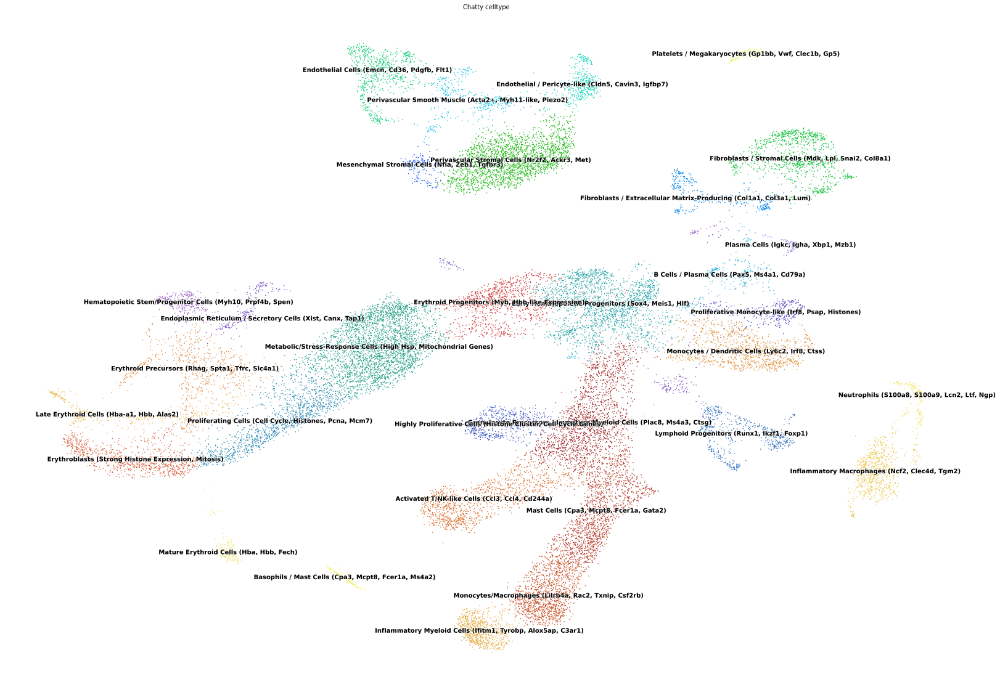

saving figure to file ./figures/scvelo__all_data_Chatty_celltype.svg


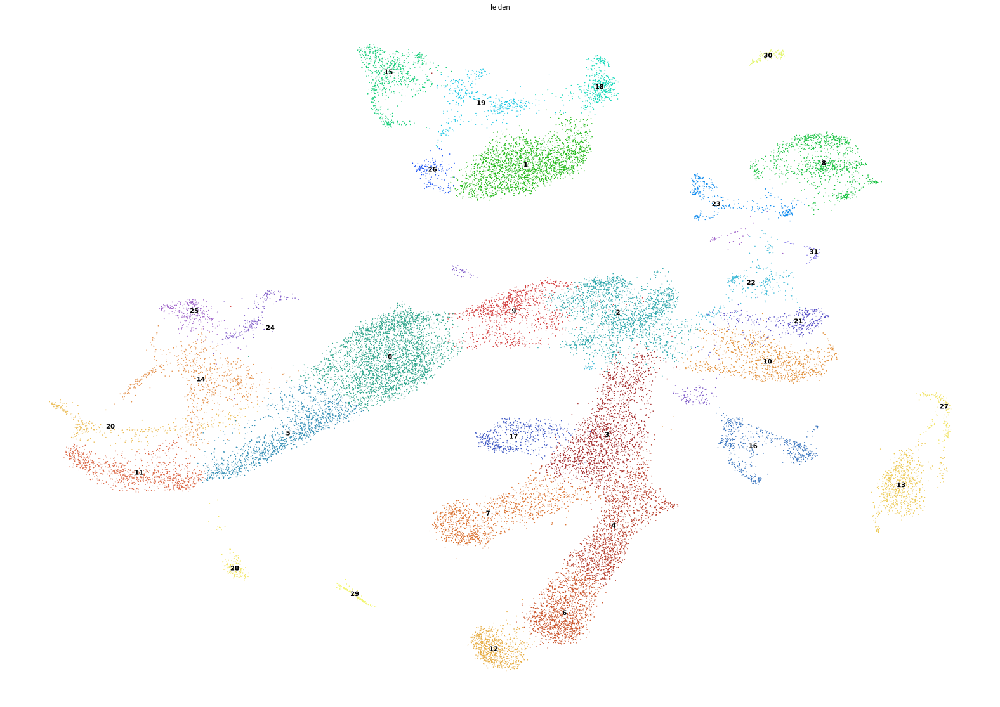

time: 3.09 s (started: 2025-08-27 09:44:55 +02:00)


In [23]:
scv.pl.scatter(adata, color=[ 'Chatty_celltype'], figsize =(28,20),size=10, legend_loc='on data', save=f"_{experiment}_Chatty_celltype.svg", cmap="viridis_r")
scv.pl.scatter(adata, color=[ 'leiden'], figsize =(28,20),size=10, legend_loc='on data', save=f"_{experiment}_Chatty_celltype.svg", cmap="viridis_r")


In [26]:
adata.obs_names=adata.obs['cell']

time: 1.44 ms (started: 2025-08-27 09:52:07 +02:00)


In [27]:
adata.write( saved )
!ls -lhrt {saved}

-rw-r--r-- 1 stefanl lu-shso 154M Aug 27 09:52 Chatties_CellTypes_added.h5ad
time: 365 ms (started: 2025-08-27 09:52:09 +02:00)


In [29]:
adata.uns['Chatty_celltype_colors']

['#29a389',
 '#1eb814',
 '#2da7ac',
 '#a32929',
 '#b63b29',
 '#328eb5',
 '#ca5228',
 '#da6e2b',
 '#14c23e',
 '#d23a3a',
 '#e18e37',
 '#db6542',
 '#e7ad44',
 '#edc952',
 '#e4914c',
 '#13cd78',
 '#3773be',
 '#3d57c4',
 '#11d8b9',
 '#10c4e2',
 '#ebbc56',
 '#5249c6',
 '#41bbd8',
 '#0f8bee',
 '#7b56c7',
 '#9e61c9',
 '#134df3',
 '#f2e360',
 '#f2e561',
 '#f3f66f',
 '#e4f76e',
 '#867ce9']

time: 2.24 ms (started: 2025-08-27 10:13:42 +02:00)


In [32]:
stro = re.compile('.*Stroma.*')
[n for n in adata.obs['Chatty_celltype'].unique() if stro.match(n)]

['Perivascular Stromal Cells (Nr2f2, Ackr3, Met)',
 'Fibroblasts / Stromal Cells (Mdk, Lpl, Snai2, Col8a1)',
 'Mesenchymal Stromal Cells (Nfia, Zeb1, Tgfbr3)']

time: 2.53 ms (started: 2025-08-27 12:30:06 +02:00)


In [48]:
org=re.compile('.*Spl.*')
adata.obs['organ'] = ['Spleen' if org.match(sname) else "BM" for sname in adata.obs['sname'] ]
adata.obs[[ 'sname','organ'] ]

,sname,organ
cell,,
AAACCCAAGAGATGCC-1,PBS_Spl,Spleen
AAACCCAAGCTCGGCT-1,PBS_Spl,Spleen
AAACCCAAGGGCCTCT-1,PBS_Spl,Spleen
AAACCCAAGTTGTAGA-1,PBS_Spl,Spleen
AAACCCATCCAACCAA-1,PBS_Spl,Spleen
...,...,...
TTTGGAGCAGTTGAAA-1,PBS_CD45_Neg_gex,BM
TTTGTTGAGCTGGCCT-1,PBS_CD45_Neg_gex,BM
TTTGTTGCAGGACAGT-1,PBS_CD45_Neg_gex,BM


time: 11.8 ms (started: 2025-08-27 12:39:57 +02:00)


In [52]:
stroma = adata[adata.obs['Chatty_celltype'] == 'Fibroblasts / Stromal Cells (Mdk, Lpl, Snai2, Col8a1)']
Counter(stroma.obs['organ'])

Counter({'BM': 1051})

time: 5.38 ms (started: 2025-08-27 12:40:25 +02:00)


In [53]:
Perivascular = adata[adata.obs['Chatty_celltype'] == 'Perivascular Stromal Cells (Nr2f2, Ackr3, Met)']
Counter(Perivascular.obs['organ'])

Counter({'BM': 2093, 'Spleen': 93})

time: 5.05 ms (started: 2025-08-27 12:40:35 +02:00)


In [54]:
Mesenchymal = adata[adata.obs['Chatty_celltype'] == 'Mesenchymal Stromal Cells (Nfia, Zeb1, Tgfbr3)']
Counter(Mesenchymal.obs['organ'])

Counter({'BM': 149, 'Spleen': 13})

time: 4.84 ms (started: 2025-08-27 12:40:42 +02:00)


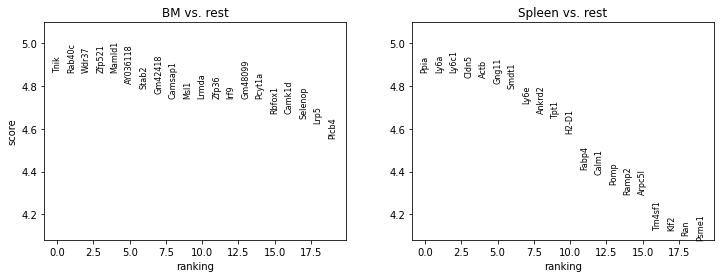

Pseudo-bulk DE analysis complete. Results stored under adata.uns['pseudo_bulk_DE']['total_Perivascular_Stromal_Cells_organ_stats'].
saving figure to file ./figures/scvelo__total_Perivascular_Stromal_Cells_organ.svg


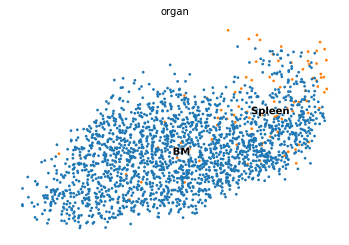

time: 1.03 s (started: 2025-08-27 12:46:53 +02:00)


In [61]:
functions.write_pseudobulk_stats_tables(Perivascular,   f"total_Perivascular_Stromal_Cells_organ_stats", 'organ')
scv.pl.scatter(Perivascular, color=[ 'organ'],size=30, legend_loc='on data', save=f"_total_Perivascular_Stromal_Cells_organ.svg", cmap="viridis_r")


In [63]:
functions.write_top_genes_per_cluster( Perivascular, 'total_Perivascular_Stromal_Cells_organ_stats', n_top_genes=30, output_file="Perivascular_top_30.csv")

Top 30 genes per cluster have been written to Perivascular_top_30.csv


{'BM': ['Tnik',
  'Rab40c',
  'Wdr37',
  'Zfp521',
  'Mamld1',
  'AY036118',
  'Stab2',
  'Gm42418',
  'Camsap1',
  'Msl1',
  'Lrmda',
  'Zfp36',
  'Irf9',
  'Gm48099',
  'Pcyt1a',
  'Rbfox1',
  'Camk1d',
  'Selenop',
  'Lrp5',
  'Plcb4',
  'Ftx',
  'Stox2',
  'Ppp6r1',
  'Srp68',
  'Gosr1',
  'Mlh3',
  'Mgat3',
  'Dnajb12',
  'Ptprb',
  'Arhgap23'],
 'Spleen': ['Ppia',
  'Ly6a',
  'Ly6c1',
  'Cldn5',
  'Actb',
  'Gng11',
  'Smdt1',
  'Ly6e',
  'Ankrd2',
  'Tpt1',
  'H2-D1',
  'Fabp4',
  'Calm1',
  'Pomp',
  'Ramp2',
  'Arpc5l',
  'Tm4sf1',
  'Klf2',
  'Ran',
  'Psme1',
  'Nme2',
  'Ap2s1',
  'Kmt5a',
  'Tuba1b',
  'Fkbp2',
  'Hint1',
  'Dbi',
  'Meaf6',
  'Arl6ip1',
  'Myl6']}

time: 4.85 ms (started: 2025-08-27 12:49:50 +02:00)


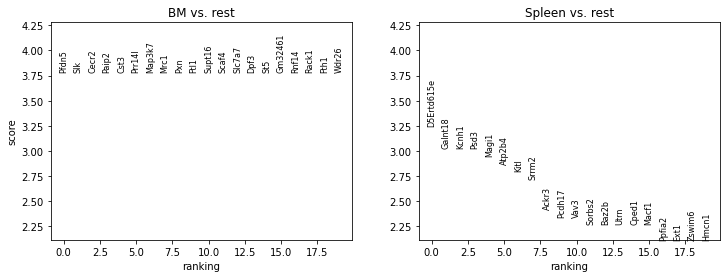

Pseudo-bulk DE analysis complete. Results stored under adata.uns['pseudo_bulk_DE']['total_Mesenchymal_Stromal_Cells_organ_stats'].
saving figure to file ./figures/scvelo__total_Mesenchymal_Stromal_Cells_organ.svg


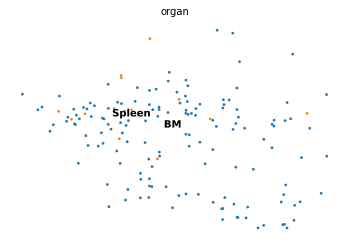

time: 812 ms (started: 2025-08-27 12:46:57 +02:00)


In [62]:
functions.write_pseudobulk_stats_tables(Mesenchymal,   f"total_Mesenchymal_Stromal_Cells_organ_stats", 'organ')
scv.pl.scatter(Mesenchymal, color=[ 'organ'],size=30, legend_loc='on data', save=f"_total_Mesenchymal_Stromal_Cells_organ.svg", cmap="viridis_r")

In [64]:
functions.write_top_genes_per_cluster( Mesenchymal, 'total_Mesenchymal_Stromal_Cells_organ_stats', n_top_genes=30, output_file="Mesenchymal_top_30.csv")

Top 30 genes per cluster have been written to Mesenchymal_top_30.csv


{'BM': ['Pfdn5',
  'Slk',
  'Cecr2',
  'Paip2',
  'Cst3',
  'Prr14l',
  'Map3k7',
  'Mrc1',
  'Pxn',
  'Ftl1',
  'Supt16',
  'Scaf4',
  'Slc7a7',
  'Dpf3',
  'St5',
  'Gm32461',
  'Rnf14',
  'Rack1',
  'Fth1',
  'Wdr26',
  'Smg7',
  'Dlg1',
  'Evi5',
  'H2-Q4',
  'Zfp292',
  'Nfat5',
  'Gngt2',
  'Ep400',
  'Bmp6',
  'Tmem59'],
 'Spleen': ['D5Ertd615e',
  'Galnt18',
  'Kcnh1',
  'Psd3',
  'Magi1',
  'Atp2b4',
  'Kitl',
  'Srrm2',
  'Ackr3',
  'Pcdh17',
  'Vav3',
  'Sorbs2',
  'Baz2b',
  'Utrn',
  'Cped1',
  'Macf1',
  'Ppfia2',
  'Ext1',
  'Zswim6',
  'Hmcn1',
  'Dst',
  'Magi2',
  'Stab1',
  'Rbms1',
  'Shank3',
  'Dleu2',
  'B3galt1',
  'Sash1',
  'Pdcd4',
  'Ankrd17']}

time: 4.09 ms (started: 2025-08-27 12:50:24 +02:00)


In [60]:
Mesenchymal.var_names

Index(['Xkr4', 'Sox17', 'Gm37587', 'Mrpl15', 'Lypla1', 'Tcea1', 'Rgs20',
       'Atp6v1h', 'Rb1cc1', '4732440D04Rik',
       ...
       'AC168977.1', 'CAAA01118383.1', 'Csprs', 'Vamp7', 'Tmlhe', 'CR974586.4',
       '4933409K07Rik', 'Gm10931', 'CAAA01147332.1', 'AC149090.1'],
      dtype='object', length=19738)

time: 4.27 ms (started: 2025-08-27 12:45:59 +02:00)
